In [160]:
import networkx as nx
import pandas as pd
import networkx.algorithms.community as nx_comm
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import scipy.io
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns


In [162]:
archivo = r"Coactivation_matrix.mat"

In [164]:
mat_json = scipy.io.loadmat(archivo)

In [166]:
mat_dict = {k:v for k, v in mat_json.items() if k[0] != '_'}
mat_dict

{'Coactivation_matrix': array([[0.        , 0.16071429, 0.11148649, ..., 0.        , 0.05045872,
         0.1011236 ],
        [0.16071429, 0.        , 0.06825939, ..., 0.        , 0.        ,
         0.06923077],
        [0.11148649, 0.06825939, 0.        , ..., 0.03412969, 0.        ,
         0.        ],
        ...,
        [0.        , 0.        , 0.03412969, ..., 0.        , 0.        ,
         0.        ],
        [0.05045872, 0.        , 0.        , ..., 0.        , 0.        ,
         0.09777778],
        [0.1011236 , 0.06923077, 0.        , ..., 0.        , 0.09777778,
         0.        ]]),
 'Coord': array([[ 7.24363636, 37.01090909,  9.42545455],
        [ 7.98653199, 46.22222222, 15.60942761],
        [ 7.55725191, 33.83206107, 23.51145038],
        ...,
        [-4.92385787, 15.31979695, 27.73604061],
        [-6.27312775, 34.70484581, -5.09251101],
        [-4.53874539, 46.53874539,  3.06273063]])}

In [168]:
mat_dict.keys()

dict_keys(['Coactivation_matrix', 'Coord'])

In [170]:
coactmat= mat_json['Coactivation_matrix']
coordenadas = mat_json['Coord']

coactmat_shape = coactmat.shape
coord_shape= coordenadas.shape

coactmat_shape, coord_shape

((638, 638), (638, 3))

In [172]:
# 1

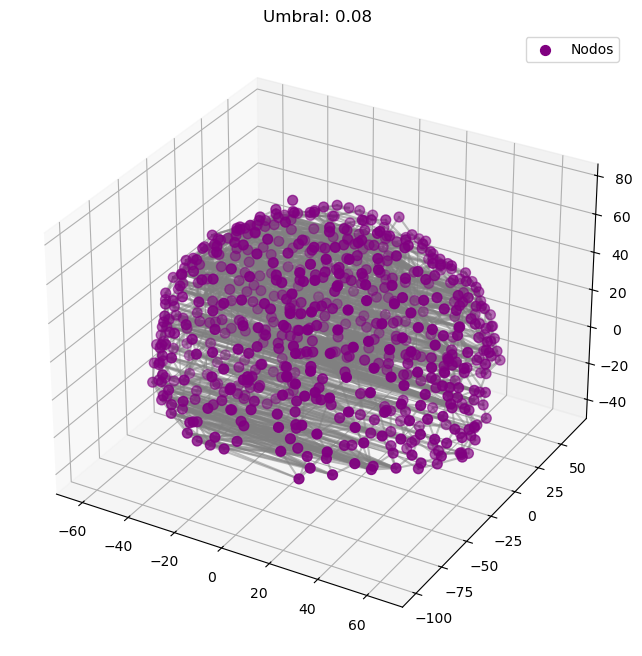

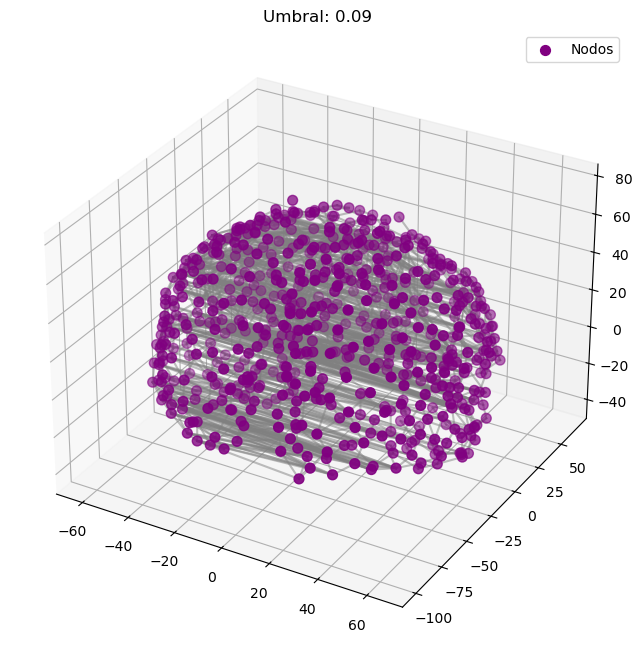

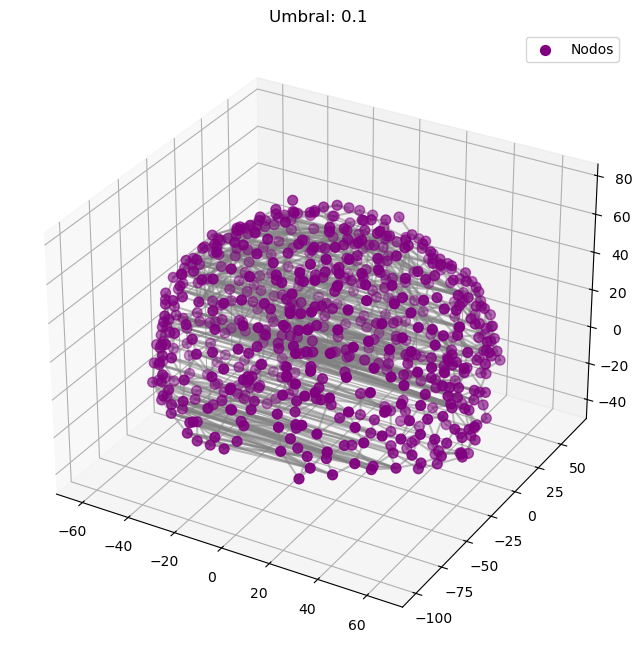

In [174]:

def generate_graph(mat, umbral, coordenadas):

    matadj = (mat >= umbral).astype(int)
    np.fill_diagonal(matadj, 0)


    G = nx.from_numpy_array(matadj)
    

    for i, coord in enumerate(coordenadas):
        G.nodes[i]['pos'] = coord

    return G



umbrales = [0.08, 0.09, 0.10]
graphs = {umbral: generate_graph(coactmat, umbral, coordenadas) for umbral in umbrales}


def plot_graph_3d(G, title):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    

    pos = nx.get_node_attributes(G, 'pos') 
    x, y, z = np.array(list(pos.values())).T

    ax.scatter(x, y, z, c='purple', s=50, label='Nodos')


    for edge in G.edges():
        x_edge, y_edge, z_edge = zip(pos[edge[0]], pos[edge[1]])
        ax.plot(x_edge, y_edge, z_edge, c='gray', alpha=0.5)

    ax.set_title(title)
    plt.legend()
    plt.show()


for umbral, graph in graphs.items():
    plot_graph_3d(graph, f"Umbral: {umbral}")

In [175]:
# 2.

In [176]:
from matplotlib.animation import FuncAnimation

def animacion_grafo(G, ej2):
    fig = plt.figure()
    ax= fig.add_subplot(111, projection ='3d')
    pos= nx.get_node_attributes(G, 'pos')
    x, y, z= np.array(list(pos.values())).T
    

    scatter= ax.scatter(x,y,z, c='purple', s=20, label='Nodos')
    lines = []
    for edge in G.edges():
        x_edge, y_edge, z_edge = zip(pos[edge[0]],pos[edge[1]])
        lines.append(ax.plot( x_edge, y_edge, z_edge, c= 'lightblue', alpha= 0.5)[0])
        
    ax.set_title("Umbral: 0.09")

    def update(frame):
        ax.view_init(elev=10, azim=frame)
        return scatter, *lines
        
 
    ani = FuncAnimation(fig, update, frames= np.arange(0, 360, 2), interval= 50, blit= False)
    


    ani.save(ej2, writer='pillow', fps=20)
    plt.close(fig)
 
ruta_archivo = r"grafo1.gif"
grafo09= graphs[0.09]
animacion_grafo(grafo09, ruta_archivo)

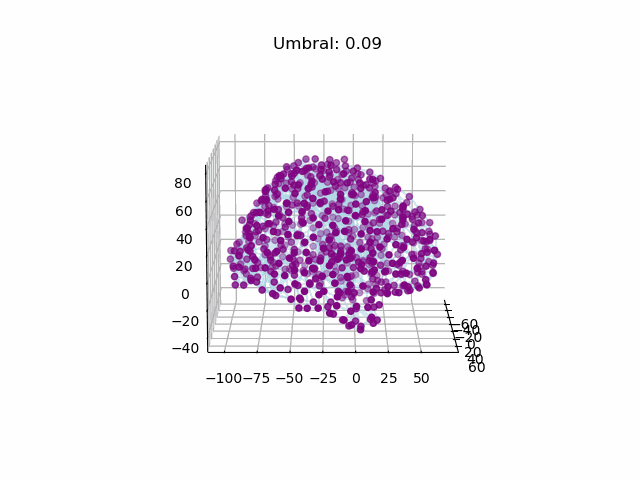

In [177]:

from IPython.display import Image
Image(r"grafo1.gif") 

In [178]:
#3

Grado: {0: 6, 1: 5, 2: 4, 3: 3, 4: 3, 5: 3, 6: 7, 7: 9, 8: 3, 9: 3, 10: 3, 11: 4, 12: 3, 13: 2, 14: 2, 15: 4, 16: 9, 17: 5, 18: 6, 19: 10, 20: 3, 21: 5, 22: 5, 23: 3, 24: 5, 25: 4, 26: 4, 27: 6, 28: 4, 29: 5, 30: 5, 31: 5, 32: 6, 33: 3, 34: 6, 35: 6, 36: 5, 37: 8, 38: 21, 39: 3, 40: 5, 41: 7, 42: 8, 43: 5, 44: 8, 45: 6, 46: 3, 47: 3, 48: 4, 49: 4, 50: 4, 51: 3, 52: 3, 53: 3, 54: 6, 55: 4, 56: 2, 57: 5, 58: 3, 59: 4, 60: 3, 61: 3, 62: 9, 63: 5, 64: 6, 65: 7, 66: 4, 67: 5, 68: 6, 69: 12, 70: 12, 71: 4, 72: 5, 73: 7, 74: 4, 75: 3, 76: 4, 77: 4, 78: 3, 79: 2, 80: 4, 81: 6, 82: 3, 83: 4, 84: 5, 85: 4, 86: 6, 87: 5, 88: 3, 89: 3, 90: 3, 91: 4, 92: 3, 93: 5, 94: 4, 95: 5, 96: 3, 97: 5, 98: 5, 99: 5, 100: 13, 101: 3, 102: 4, 103: 5, 104: 5, 105: 4, 106: 4, 107: 4, 108: 5, 109: 3, 110: 6, 111: 4, 112: 4, 113: 5, 114: 3, 115: 3, 116: 5, 117: 4, 118: 5, 119: 3, 120: 7, 121: 11, 122: 6, 123: 3, 124: 5, 125: 6, 126: 9, 127: 4, 128: 5, 129: 3, 130: 7, 131: 6, 132: 4, 133: 5, 134: 6, 135: 16, 136: 4,

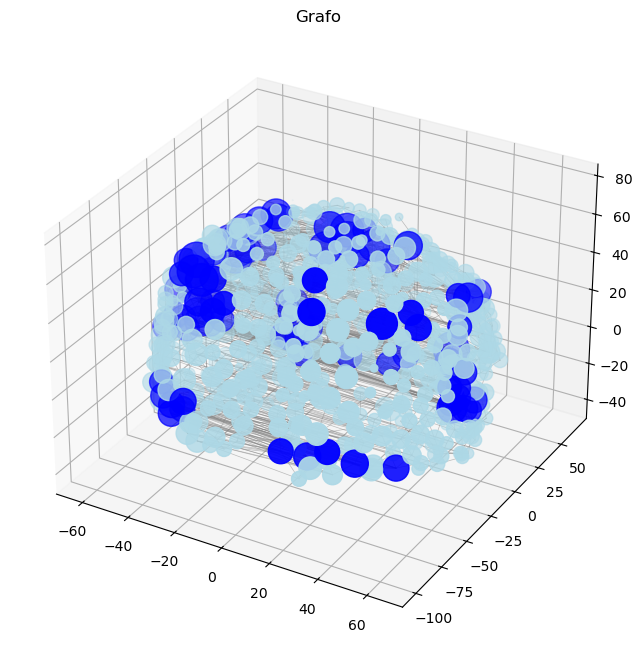

In [179]:
def plot_hubs(G, ej3a):
   
    pos = nx.get_node_attributes(G, 'pos')
    x, y, z = np.array(list(pos.values())).T


    grados = dict(G.degree())
    print("Grado:", grados)


    tam_min, tam_max = 0.01, 700
    grad_max = max(grados.values())
    tamnod = [
        tam_min + (grado / grad_max) * (tam_max - tam_min) for grado in grados.values()
    ]

     # XQ THRESHOLD = 90?
    # hub = grado arriba de media +una desviación estandar
    umbral = np.percentile(list(grados.values()), 90)
    hub_nodes = [node for node, grado in grados.items() if grado >= umbral]
    print(f"Hubs: (grado ≥ {umbral}): {hub_nodes}")


    nodcol = ['blue' if node in hub_nodes else 'lightblue' for node in G.nodes()]


    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')


    scatter = ax.scatter(x, y, z, c=nodcol, s=tamnod, label='Nodos')


    for edge in G.edges():
        x_edge, y_edge, z_edge = zip(pos[edge[0]], pos[edge[1]])
        ax.plot(x_edge, y_edge, z_edge, c='gray', alpha=0.5, linewidth=0.5)

   
    ax.set_title(ej3a)

    plt.show()


grafoN = generate_graph(coactmat, 0.09, coordenadas)
plot_hubs(grafoN, "Grafo")

In [180]:
#4.

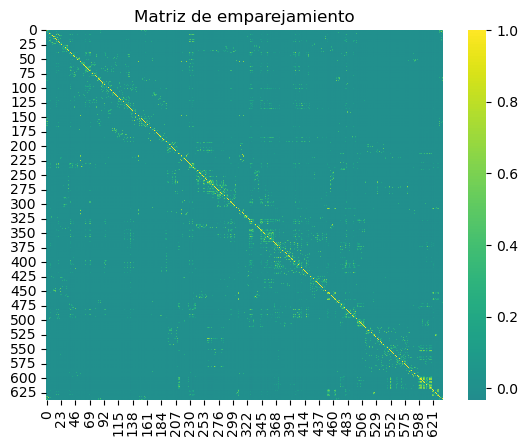

Modularidad calculada: 0.4895


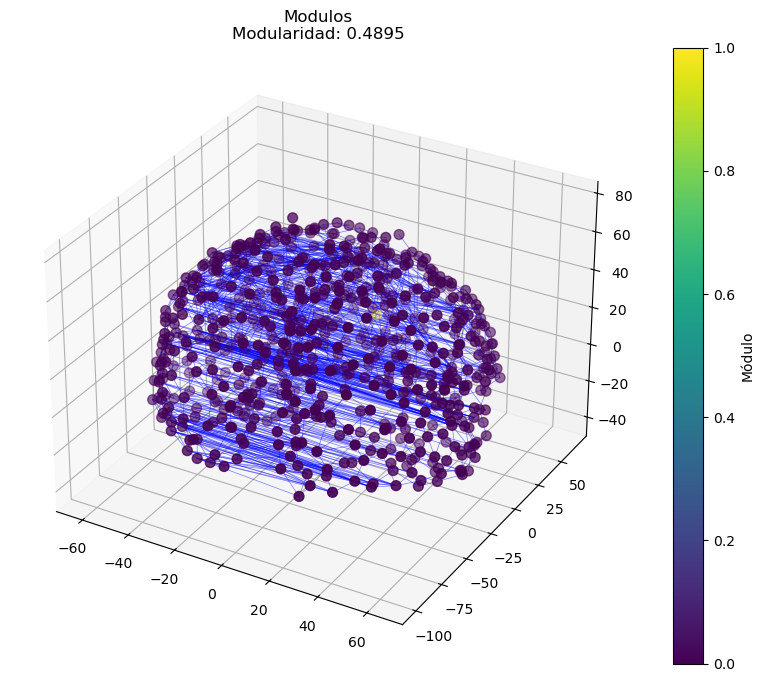

In [191]:
def robust_corrcoef(mat):
    
    std_dev = np.std(mat, axis=1)
    valid_rows = std_dev > 0  
    filtered_mat = mat[valid_rows][:, valid_rows]
    return np.corrcoef(filtered_mat)

def modulos(G, ej4):

    matadj = nx.to_numpy_array(G)
    try:
        corrmat = robust_corrcoef(matadj)
    except ValueError as e:
        print(e)
        return  

    sns.heatmap(corrmat, cmap="viridis", center=0)
    plt.title("Matriz de emparejamiento")
    plt.show()

    components = list(nx.connected_components(G))
    particion = {node: idx for idx, comp in enumerate(components) for node in comp}

    nodcol = list(particion.values())

    m = G.number_of_edges()
    modularidad = sum(
        (1 if (u in G[v]) else 0) - G.degree[u] * G.degree[v] / (2 * m)
        for u, v in G.edges() if particion[u] == particion[v]
    ) / (2 * m)
    print(f"Modularidad calculada: {modularidad:.4f}")

    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    pos = nx.get_node_attributes(G, 'pos')

    x, y, z = np.array(list(pos.values())).T

    scatter = ax.scatter(x, y, z, c=nodcol, cmap="viridis", s=50, label='Nodos')

    for edge in G.edges():
        x_edge, y_edge, z_edge = zip(pos[edge[0]], pos[edge[1]])
        ax.plot(x_edge, y_edge, z_edge, c='b', alpha=0.5, linewidth=0.5)
    
    ax.set_title(f"{ej4}\nModularidad: {modularidad:.4f}")
    plt.colorbar(scatter, ax=ax, label="Módulo")
    plt.show()



grafo09 = generate_graph(coactmat, 0.09, coordenadas)


modulos(grafo09, "Modulos")

# FALTÓ LA JUSTIFICACIÓN

In [ ]:
# 5.

Nodos Rich Club ≥ 10): [19, 38, 69, 70, 100, 121, 135, 186, 202, 213, 230, 235, 237, 253, 261, 262, 266, 267, 271, 279, 285, 308, 309, 327, 328, 330, 331, 334, 344, 345, 346, 350, 352, 353, 356, 361, 362, 373, 393, 397, 400, 403, 407, 410, 416, 418, 452, 453, 454, 457, 465, 473, 477, 481, 482, 485, 488, 491, 494, 496, 500, 532, 552, 553, 599, 601, 603, 606, 607, 611, 612, 613, 615, 616, 617, 618, 619, 621, 622, 629]


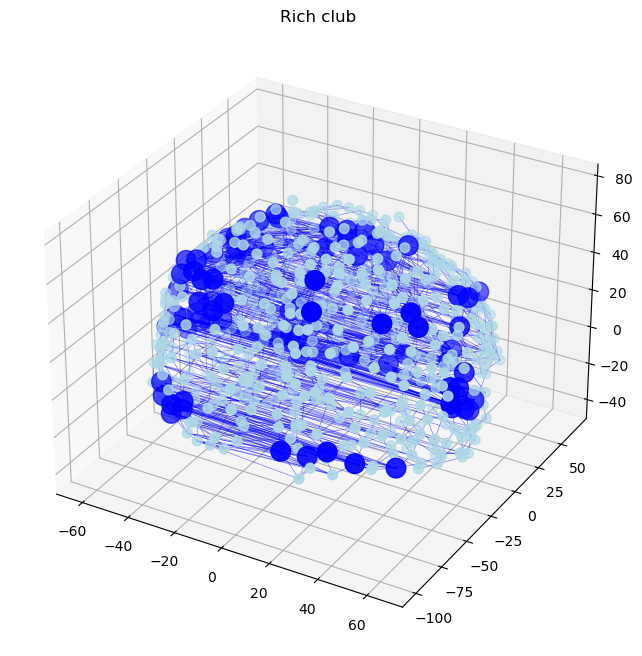

In [193]:
def rich_club(G, ej5, min_degree=10):
    

    grados= dict(G.degree())
    

    rc_nodes= [node for node, degree in grados.items() if degree >= min_degree]
    print(f"Nodos Rich Club ≥ {min_degree}): {rc_nodes}")

    pos= nx.get_node_attributes(G, 'pos')
    x,y,z = np.array(list(pos.values())).T


    node_color = ['blue' if node in rc_nodes else 'lightblue' for node in G.nodes()]
    node_sizes = [200 if node in rc_nodes else 50 for node in G.nodes()]


    fig= plt.figure(figsize=(12,8))
    ax= fig.add_subplot(111, projection='3d')

    ax.scatter(x, y, z, c=node_color, s=node_sizes, label='Nodos')


    for edge in G.edges():
        if edge[0] in pos and edge[1] in pos:
            x_edge, y_edge, z_edge = zip(pos[edge[0]], pos[edge[1]])
            ax.plot(x_edge, y_edge, z_edge, c='b', alpha=0.5, linewidth=0.5)


    ax.set_title(ej5)

    plt.show()


grafo09= generate_graph(coactmat, 0.09, coordenadas)

rich_club(grafo09, "Rich club", min_degree=10)

In [195]:
"""
Discusión
Son probablemente los nodos más importantes debido a que no sólo están muy conectados sino con otros hubs, ergo son necesarios.
Casos del rich club incluyen el hipotalamo, el talamo o la amigdala, perderlos en una persona altera gravemente la conducta 
o la capacidad perceptual o de memoria.
"""

'\nDiscusión\nSon probablemente los nodos más importantes debido a que no sólo están muy conectados sino con otros hubs, ergo son necesarios.\nCasos del rich club incluyen el hipotalamo, el talamo o la amigdala, perderlos en una persona altera gravemente la conducta \no la capacidad perceptual o de memoria.\n'

In [197]:
# 6.

{'grado_medio': 4.529780564263323, 'coeficiente_de_agrupamiento': 0.24364464673564803, 'centralidad_cercania': 0.1194031264903796, 'centralidad_intermediacion': 0.01147712930871217}
Nodos Rich Club (grado ≥ 10): [38, 70, 186, 230, 235, 253, 262, 328, 330, 334, 346, 356, 362, 397, 400, 407, 416, 454, 473, 477, 481, 482, 485, 488, 491, 494, 532, 599, 603, 606, 607, 616, 617, 619, 629]
{'grado_medio': 3.691542288557214, 'coeficiente_de_agrupamiento': 0.22183658427439523, 'centralidad_cercania': 0.09214115900724197, 'centralidad_intermediacion': 0.016110568269096143}
Grado_medio:
  Original: 4.5298
  Modificado: 3.6915
  Cambio: -18.51%

Coeficiente_de_agrupamiento:
  Original: 0.2436
  Modificado: 0.2218
  Cambio: -8.95%

Centralidad_cercania:
  Original: 0.1194
  Modificado: 0.0921
  Cambio: -22.83%

Centralidad_intermediacion:
  Original: 0.0115
  Modificado: 0.0161
  Cambio: 40.37%



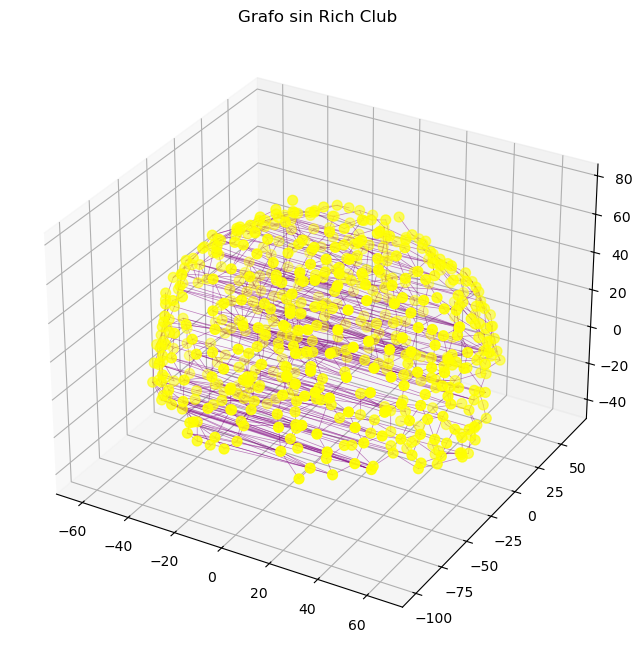

In [203]:
def propiedades_grafo(G):
    propiedades = {}

    avg_degree = sum(dict(G.degree()).values()) / G.number_of_nodes()
    propiedades['grado_medio'] = avg_degree

    clustering_coeff = nx.average_clustering(G)
    propiedades['coeficiente_de_agrupamiento'] = clustering_coeff

    closeness_centrality = np.mean(list(nx.closeness_centrality(G).values()))
    propiedades['centralidad_cercania'] = closeness_centrality

    betweenness = nx.betweenness_centrality(G)
    betweenness_centrality = np.mean(list(betweenness.values()))
    propiedades['centralidad_intermediacion'] = betweenness_centrality

    return propiedades

def comparacion_propiedades(original_data, modified_data):
    for prop in original_data.keys():
        original = original_data[prop]
        modified = modified_data[prop]
        change = ((modified - original) / original) * 100 if original != 0 else "N/A"
        print(f"{prop.capitalize()}:")
        print(f"  Original: {original:.4f}")
        print(f"  Modificado: {modified:.4f}")
        print(f"  Cambio: {change if change == 'N/A' else change:.2f}%\n")

grafo_original = generate_graph(coactmat, 0.1, coordenadas)
degrees = dict(grafo_original.degree())

original_data = propiedades_grafo(grafo_original)
print(original_data)

min_degree = 10
rich_club_nodes = [node for node, degree in degrees.items() if degree >= min_degree]
print(f"Nodos Rich Club (grado ≥ {min_degree}): {rich_club_nodes}")

grafo_modificado = grafo_original.copy()
grafo_modificado.remove_nodes_from(rich_club_nodes)

modified_data = propiedades_grafo(grafo_modificado)
print(modified_data)

comparacion_propiedades(original_data, modified_data)

def plot_grafo(G, title):
    positions = nx.get_node_attributes(G, 'pos')
    x_coords, y_coords, z_coords = np.array(list(positions.values())).T

    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    scatter = ax.scatter(x_coords, y_coords, z_coords, c='yellow', s=50)
    for edge in G.edges():
        x_edge, y_edge, z_edge = zip(positions[edge[0]], positions[edge[1]])
        ax.plot(x_edge, y_edge, z_edge, c='purple', alpha=0.5, linewidth=0.5)

    ax.set_title(title)
    plt.show()

plot_grafo(grafo_modificado, "Grafo sin Rich Club")


In [ ]:
#7.

{'grado_medio': 5.614420062695925, 'coef_clust': 0.2785052819986504, 'cent_cercania': 0.14410899273204028, 'cent_inter': 0.009627134336679834}
10%:
{'grado_medio': 4.351304347826087, 'coef_clust': 0.26065096256400605, 'cent_cercania': 0.10502884478729942, 'cent_inter': 0.015025974434567928}
20%:
{'grado_medio': 3.675146771037182, 'coef_clust': 0.2424004892693738, 'cent_cercania': 0.07423423198025483, 'cent_inter': 0.01762977279616532}
30%:
{'grado_medio': 3.185682326621924, 'coef_clust': 0.2563371006324026, 'cent_cercania': 0.05099617054174734, 'cent_inter': 0.02392776778147008}
40%:
{'grado_medio': 2.7362924281984333, 'coef_clust': 0.22687222843880805, 'cent_cercania': 0.030301707402235555, 'cent_inter': 0.008450092358470775}
50%:
{'grado_medio': 2.3510971786833856, 'coef_clust': 0.20209732795939692, 'cent_cercania': 0.020176775727589722, 'cent_inter': 0.0023531340530123443}
Comparando propiedades:
Grado_medio:
  Original: 5.6144
  Modificado: 4.3513
  Cambio: -22.50%

Coef_clust:
  O

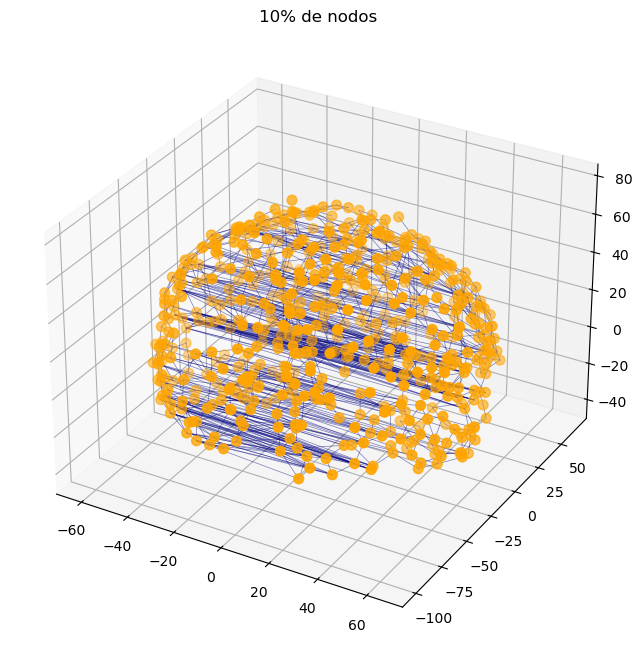

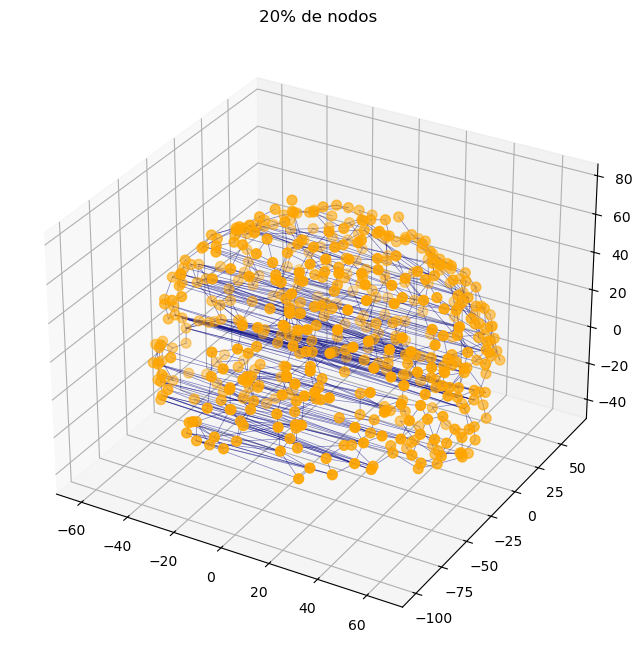

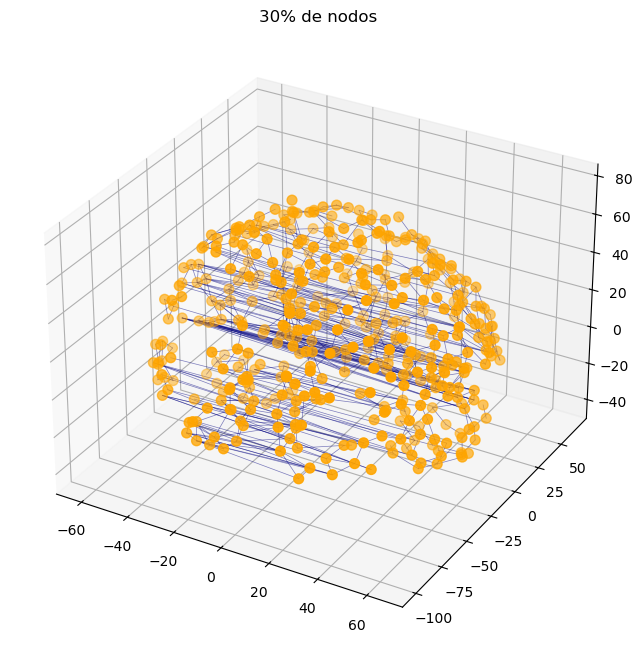

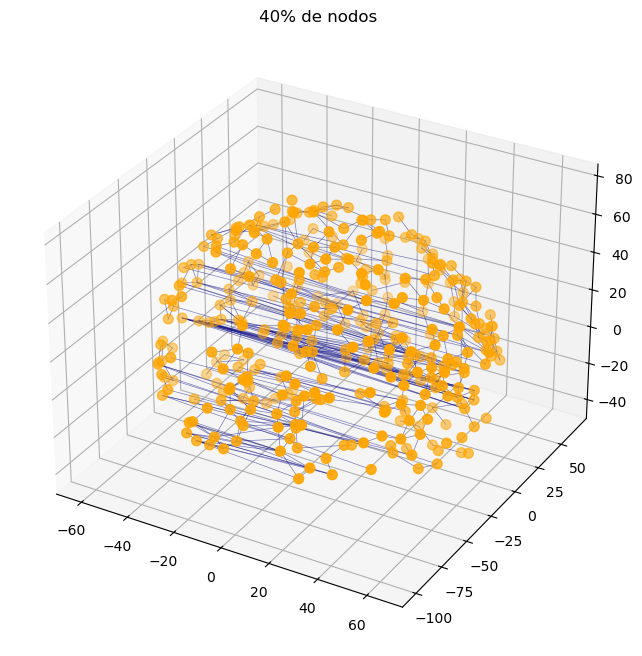

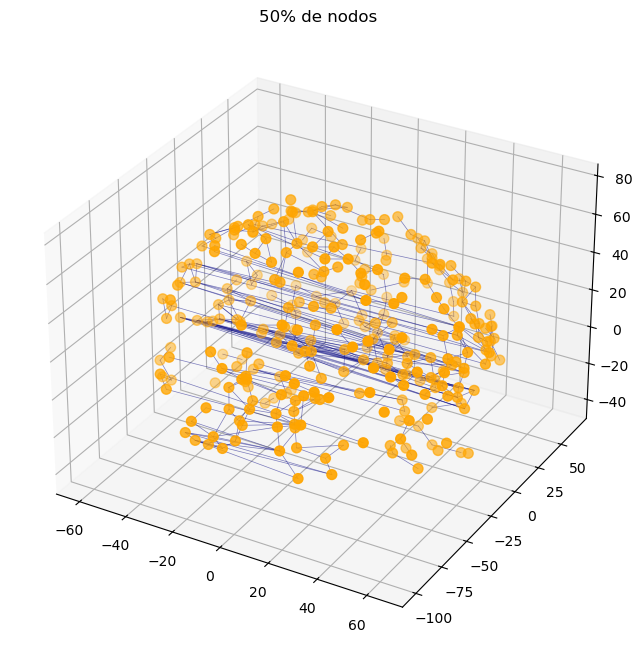

In [207]:

def graph_properties(G):
    props = {}

    avg_grad = sum(dict(G.degree()).values()) / G.number_of_nodes()
    props['grado_medio'] = avg_grad

    cluster_coef = nx.average_clustering(G)
    props['coef_clust'] = cluster_coef

    close_cent = np.mean(list(nx.closeness_centrality(G).values()))
    props['cent_cercania'] = close_cent

    btw_cent = nx.betweenness_centrality(G)
    cent_inter = np.mean(list(btw_cent.values()))
    props['cent_inter'] = cent_inter

    return props

def compare_properties(data_orig, data_mod):
    print("Comparando propiedades:")
    for prop in data_orig.keys():
        orig = data_orig[prop]
        mod = data_mod[prop]
        change = ((mod - orig) / orig) * 100 if orig != 0 else "N/A"
        print(f"{prop.capitalize()}:")
        print(f"  Original: {orig:.4f}")
        print(f"  Modificado: {mod:.4f}")
        print(f"  Cambio: {change if change == 'N/A' else change:.2f}%\n")

def remove_pct(G, pct=0.1):
    btw_cent = nx.betweenness_centrality(G)

    sorted_nodes = sorted(btw_cent.items(), key=lambda x: x[1], reverse=True)

    num_rm_nodes = int(len(sorted_nodes) * pct)
    nodes_rm = [nodo for nodo, _ in sorted_nodes[:num_rm_nodes]]

    g_mod = G.copy()
    g_mod.remove_nodes_from(nodes_rm)

    return g_mod

g_orig = generate_graph(coactmat, 0.09, coordenadas)

data_orig = graph_properties(g_orig)
print(data_orig)

pcts = [0.1, 0.2, 0.3, 0.4, 0.5]
g_mod1 = remove_pct(g_orig, pct=pcts[0])
g_mod2 = remove_pct(g_orig, pct=pcts[1])
g_mod3 = remove_pct(g_orig, pct=pcts[2])
g_mod4 = remove_pct(g_orig, pct=pcts[3])
g_mod5 = remove_pct(g_orig, pct=pcts[4])

print("10%:")
data_mod_10 = graph_properties(g_mod1)
print(data_mod_10)

print("20%:")
data_mod_20 = graph_properties(g_mod2)
print(data_mod_20)

print("30%:")
data_mod_30 = graph_properties(g_mod3)
print(data_mod_30)

print("40%:")
data_mod_40 = graph_properties(g_mod4)
print(data_mod_40)

print("50%:")
data_mod_50 = graph_properties(g_mod5)
print(data_mod_50)

compare_properties(data_orig, data_mod_10)
compare_properties(data_orig, data_mod_20)
compare_properties(data_orig, data_mod_30)
compare_properties(data_orig, data_mod_40)
compare_properties(data_orig, data_mod_50)

def plot_graph(G, titulo):
    pos = nx.get_node_attributes(G, 'pos')
    x_vals, y_vals, z_vals = np.array(list(pos.values())).T

    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    scatter = ax.scatter(x_vals, y_vals, z_vals, c='orange', s=50)
    for edge in G.edges():
        x_edge, y_edge, z_edge = zip(pos[edge[0]], pos[edge[1]])
        ax.plot(x_edge, y_edge, z_edge, c='navy', alpha=0.5, linewidth=0.5)

    ax.set_title(titulo)
    plt.show()

plot_graph(g_mod1, "10% de nodos")
plot_graph(g_mod2, "20% de nodos")
plot_graph(g_mod3, "30% de nodos")
plot_graph(g_mod4, "40% de nodos")
plot_graph(g_mod5, "50% de nodos")


In [ ]:
# 8

Props orig:
{'grado_med': 4.529780564263323, 'coef_agru': 0.24364464673564803, 'cent_cerca': 0.1194031264903796, 'cent_inter': 0.01147712930871217}
Props null:
{'grado_med': 4.529780564263323, 'coef_agru': 0.005138635311049104, 'cent_cerca': 0.22520845511120022, 'cent_inter': 0.005349222144463338}

Comp props:
Grado_med:
  Orig: 4.5298
  Mod: 4.5298
  Camb: 0.00%

Coef_agru:
  Orig: 0.2436
  Mod: 0.0051
  Camb: -97.89%

Cent_cerca:
  Orig: 0.1194
  Mod: 0.2252
  Camb: 88.61%

Cent_inter:
  Orig: 0.0115
  Mod: 0.0053
  Camb: -53.39%



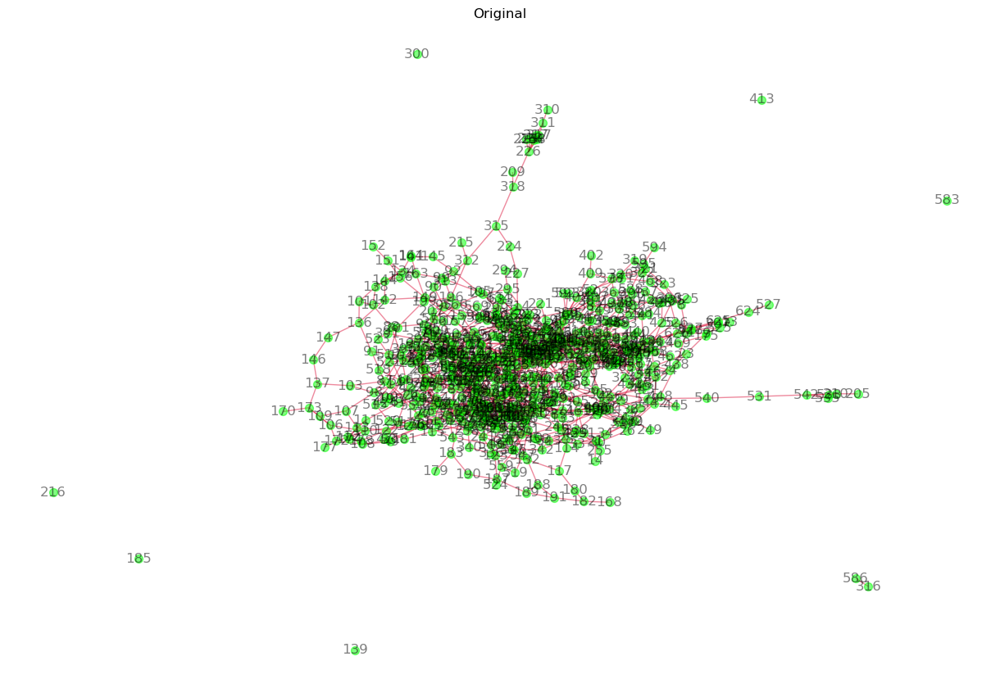

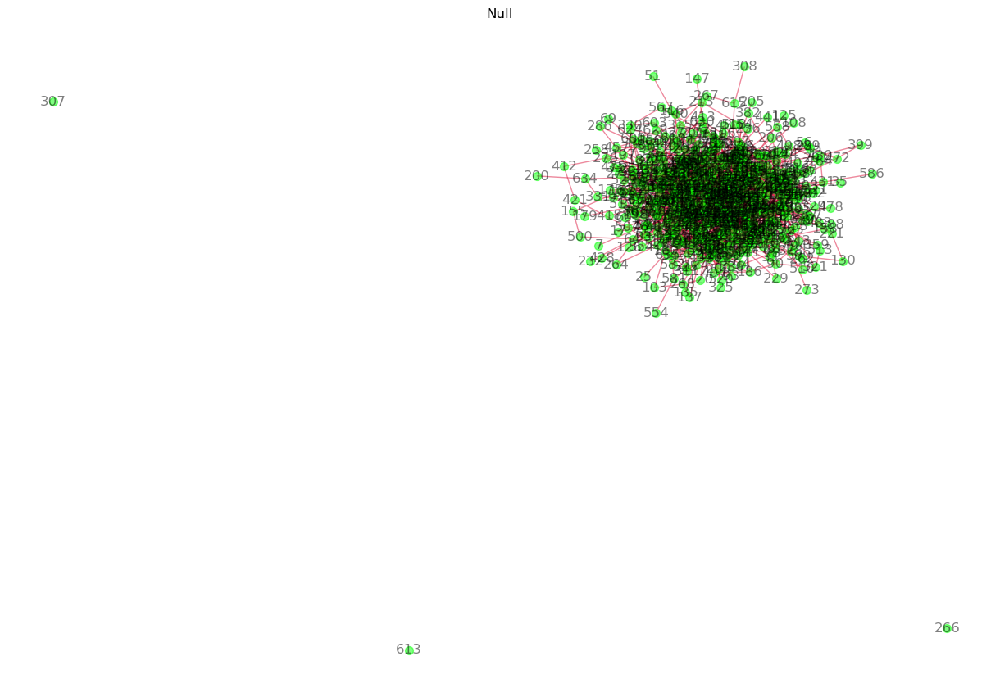

In [209]:
def props_graph(G):
    props = {}

    avg_grad = sum(dict(G.degree()).values()) / G.number_of_nodes()
    props['grado_med'] = avg_grad

    clust_coef = nx.average_clustering(G)
    props['coef_agru'] = clust_coef

    cerca_cen = np.mean(list(nx.closeness_centrality(G).values()))
    props['cent_cerca'] = cerca_cen

    inter_cen = nx.betweenness_centrality(G)
    cent_inter = np.mean(list(inter_cen.values()))
    props['cent_inter'] = cent_inter

    return props

def compare_props(data_orig, data_mod):
    print("\nComp props:")
    for prop in data_orig.keys():
        orig = data_orig[prop]
        mod = data_mod[prop]
        change = ((mod - orig) / orig) * 100 if orig != 0 else "N/A"
        print(f"{prop.capitalize()}:")
        print(f"  Orig: {orig:.4f}")
        print(f"  Mod: {mod:.4f}")
        print(f"  Camb: {change if change == 'N/A' else change:.2f}%\n")

g_orig = generate_graph(coactmat, 0.1, coordenadas)

print("Props orig:")
data_orig = props_graph(g_orig)
print(data_orig)

n_nodes = g_orig.number_of_nodes()
n_edges = g_orig.number_of_edges()

g_null = nx.gnm_random_graph(n_nodes, n_edges)

print("Props null:")
data_null = props_graph(g_null)
print(data_null)

compare_props(data_orig, data_null)

def plot_graph(G, title):
    pos = nx.spring_layout(G)
    plt.figure(figsize=(12, 8))
    nx.draw(G, pos, with_labels=True, node_color='lime', node_size=50, edge_color='crimson', alpha=0.5)
    plt.title(title)
    plt.show()

plot_graph(g_orig, "Original")
plot_graph(g_null, "Null")


In [ ]:
#9

Props orig:
{'grad_med': 4.529780564263323, 'coef_clust': 0.24364464673564803, 'cen_cerc': 0.1194031264903796, 'cen_inter': 0.01147712930871217}
Props null:
{'grad_med': 4.501567398119122, 'coef_clust': 0.012263440096281697, 'cen_cerc': 0.22990424385945024, 'cen_inter': 0.005112107584456316}
Comp props:
Grad_med:
  Orig: 4.5298
  Null: 4.5016
  Camb: -0.62%

Coef_clust:
  Orig: 0.2436
  Null: 0.0123
  Camb: -94.97%

Cen_cerc:
  Orig: 0.1194
  Null: 0.2299
  Camb: 92.54%

Cen_inter:
  Orig: 0.0115
  Null: 0.0051
  Camb: -55.46%



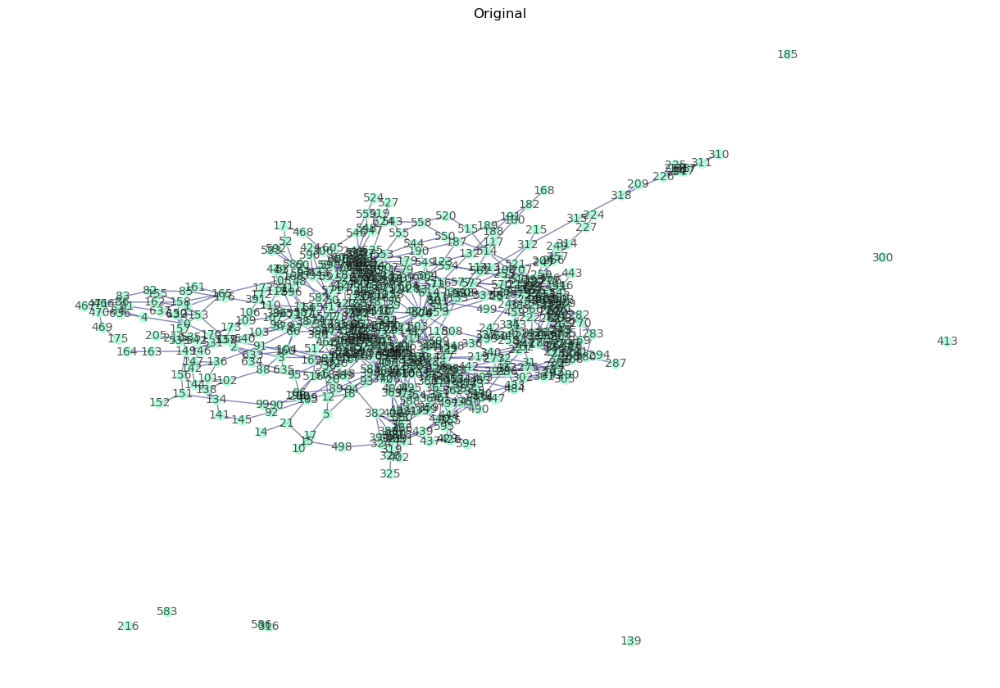

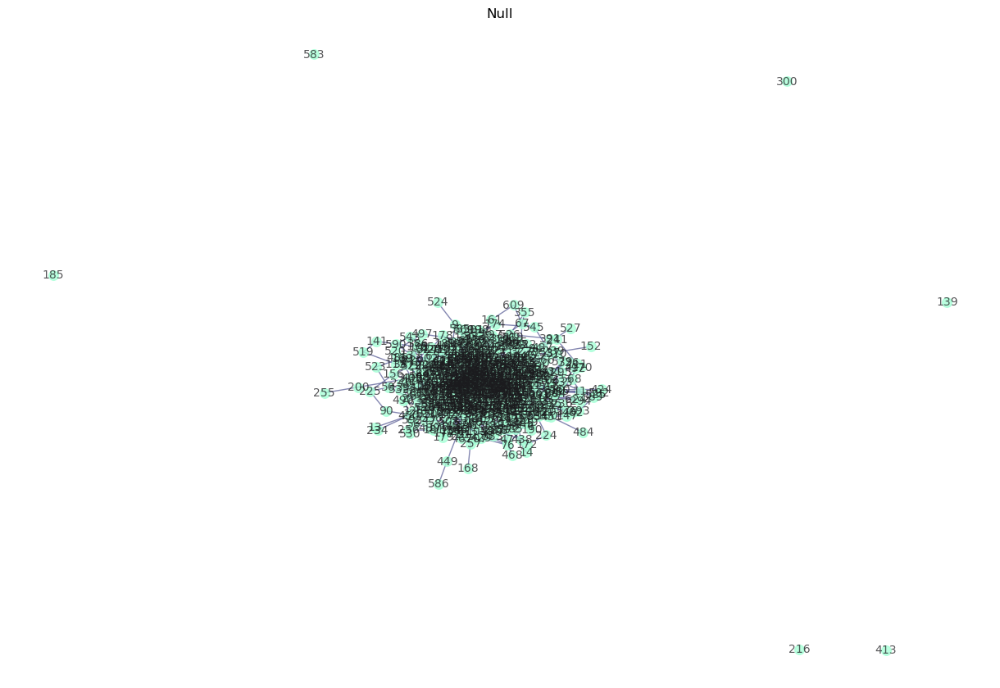

In [213]:

def graph_props(G):
    props = {}

    avg_deg = sum(dict(G.degree()).values()) / G.number_of_nodes()
    props['grad_med'] = avg_deg

    clust_coef = nx.average_clustering(G)
    props['coef_clust'] = clust_coef

    close_cen = np.mean(list(nx.closeness_centrality(G).values()))
    props['cen_cerc'] = close_cen

    inter_cen = nx.betweenness_centrality(G)
    cent_inter = np.mean(list(inter_cen.values()))
    props['cen_inter'] = cent_inter

    return props

def comp_props(orig_data, null_data):
    print("Comp props:")
    for prop in orig_data.keys():
        orig = orig_data[prop]
        null = null_data[prop]
        change = ((null - orig) / orig) * 100 if orig != 0 else "N/A"
        print(f"{prop.capitalize()}:")
        print(f"  Orig: {orig:.4f}")
        print(f"  Null: {null:.4f}")
        print(f"  Camb: {change if change == 'N/A' else change:.2f}%\n")

g_orig = generate_graph(coactmat, 0.1, coordenadas)

print("Props orig:")
orig_data = graph_props(g_orig)
print(orig_data)

g_null_multigraph = nx.configuration_model([g_orig.degree(n) for n in g_orig.nodes()])

g_null_multigraph.remove_edges_from(nx.selfloop_edges(g_null_multigraph))

g_null = nx.Graph(g_null_multigraph)

print("Props null:")
null_data = graph_props(g_null)
print(null_data)

comp_props(orig_data, null_data)

def plot_graph(G, title):
    positions = nx.spring_layout(G)
    plt.figure(figsize=(12, 8))
    nx.draw(
        G,
        positions,
        with_labels=True,
        node_color='#A5FFD6',  # Soft mint green
        node_size=70,
        edge_color='#5B5F97',  # Muted purple-blue
        alpha=0.75,
        font_color='#1B1B1E',  # Charcoal black for labels
        font_size=10
    )
    plt.title(title)
    plt.show()

plot_graph(g_orig, "Original")
plot_graph(g_null, "Null")


In [ ]:
# 10.

Props orig:
{'grad_med': 4.529780564263323, 'coef_agru': 0.24364464673564803, 'cerc_cen': 0.1194031264903796, 'cen_inter': 0.01147712930871217}
Props nulo:
{'grad_med': 4.492163009404389, 'coef_agru': 0.006415861680475362, 'cerc_cen': 0.22931893322067065, 'cen_inter': 0.0051270181626162665}
Comp props:
Grad_med:
  Orig: 4.5298
  Nulo: 4.4922
  Camb: -0.83%

Coef_agru:
  Orig: 0.2436
  Nulo: 0.0064
  Camb: -97.37%

Cerc_cen:
  Orig: 0.1194
  Nulo: 0.2293
  Camb: 92.05%

Cen_inter:
  Orig: 0.0115
  Nulo: 0.0051
  Camb: -55.33%



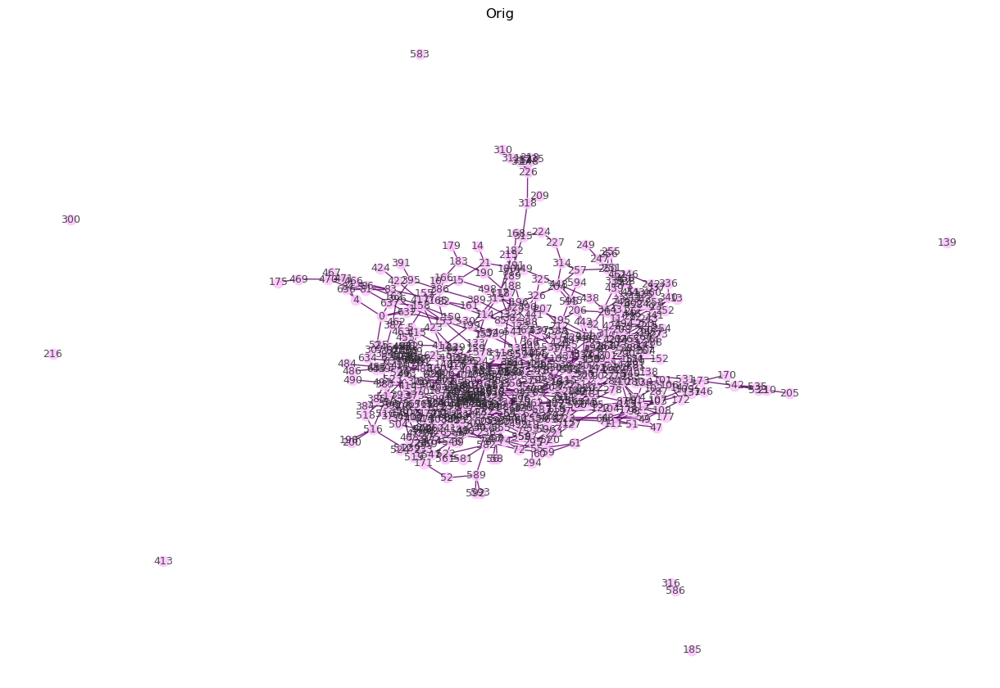

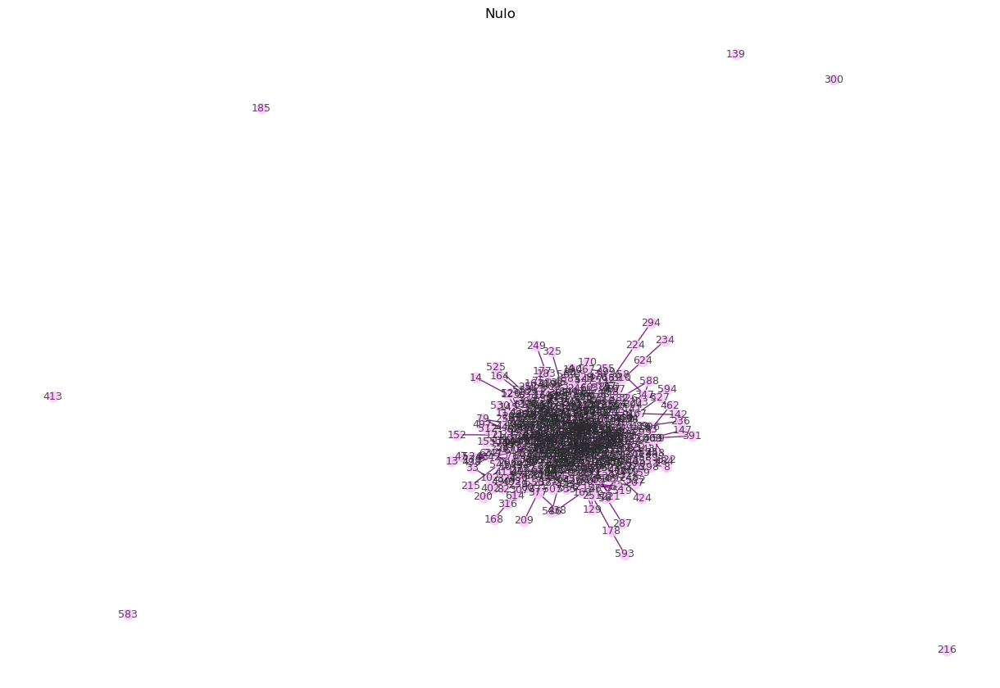

In [215]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

def props_grafo(G):
    props = {}

    grad_med = sum(dict(G.degree()).values()) / G.number_of_nodes()
    props['grad_med'] = grad_med

    coef_agru = nx.average_clustering(G)
    props['coef_agru'] = coef_agru

    cerc_cen = np.mean(list(nx.closeness_centrality(G).values()))
    props['cerc_cen'] = cerc_cen

    inter_cen = nx.betweenness_centrality(G)
    cen_inter = np.mean(list(inter_cen.values()))
    props['cen_inter'] = cen_inter

    return props

def comp_props(orig, nulo):
    print("Comp props:")
    for prop in orig.keys():
        orig_val = orig[prop]
        nulo_val = nulo[prop]
        cambio = ((nulo_val - orig_val) / orig_val) * 100 if orig_val != 0 else "N/A"
        print(f"{prop.capitalize()}:")
        print(f"  Orig: {orig_val:.4f}")
        print(f"  Nulo: {nulo_val:.4f}")
        print(f"  Camb: {cambio if cambio == 'N/A' else cambio:.2f}%\n")

g_orig = generate_graph(coactmat, 0.1, coordenadas)

print("Props orig:")
orig = props_grafo(g_orig)
print(orig)

g_nulo_multi = nx.configuration_model([g_orig.degree(n) for n in g_orig.nodes()])

g_nulo_multi.remove_edges_from(nx.selfloop_edges(g_nulo_multi))

g_nulo = nx.Graph(g_nulo_multi)

print("Props nulo:")
nulo = props_grafo(g_nulo)
print(nulo)

comp_props(orig, nulo)

def plot_grafo(G, titulo):
    pos = nx.spring_layout(G)
    plt.figure(figsize=(12, 8))
    nx.draw(
        G,
        pos,
        with_labels=True,
        node_color='#FFC6FF',  # Pastel pink
        node_size=80,
        edge_color='#6A0572',  # Deep purple
        alpha=0.85,
        font_color='#2A2A2E',  # Dark grey
        font_size=9
    )
    plt.title(titulo)
    plt.show()

plot_grafo(g_orig, "Orig")
plot_grafo(g_nulo, "Nulo")


In [ ]:
#12

In [ ]:
"""
Me gusto mucho aunque me hubiera gustado tener más entendimiento, no tuve la oportunidad de estar tan presente como quería pero disfrute
mucho las nociones matematicas y las implicaciones, aunque creo que es algo más complicado de entender de lo que es al ojo, no es algo
tan sencillo, si hubiera tenido más tiempo el proyecti hubiera salido mejor y hubiera tenido mejores concimientos, entender tambien lo 
matematico pero otro lo fisiologico lo veo como un reto noble e interesante, más en conducta y personalidad, cómo emerge el ser de la red.
Tal vez ver nodos a nivel de neuronas hubiera eatado mejor. Creo también que debi entender más y el tiempo no me dio, pero el cerebro es 
bonito y aquí retome eso, sólo quisiera que hubiera sido tal vez más conclusivo pero eso creo dependia más de mi, es curioso. Lo 
único fue que muchas cosas de como hacer para este examen en python nunca las hicimos antes del examen, saber matematicas y plotear incluso
grafos no es lo mismo, creo que se debe abarcar desde los matematico y los abstracto, 
"""